#  **LangChain** 멀티모달리티(Multimodality)

- **멀티모달리티** : 텍스트, 오디오, 이미지, 비디오 등 다양한 형태의 데이터를 처리하는 기술

    - **채팅 모델**: 다양한 입출력 형식 처리
    - **임베딩 모델**: 다양한 데이터 타입의 벡터 표현
    - **벡터 저장소**: 멀티모달 데이터의 임베딩 검색


## **채팅 모델의 멀티모달 기능**

- **멀티모달 입력**은 이미지, 오디오, 비디오, 파일 등 다양한 형태로 처리가 가능하며 메시지 객체를 통해 구현됨

- LangChain의 **도구(Tools)** 기능을 활용하면 URL 참조를 통해 간접적으로 멀티모달 데이터 처리가 가능

---

`(1) Env 환경변수`

In [1]:
from dotenv import load_dotenv
load_dotenv()

True

`(2) 기본 라이브러리`

In [2]:
import os
from glob import glob

from pprint import pprint
import json

import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

`(3) langfuase handler 설정`

In [3]:
from langfuse.langchain import CallbackHandler

# 콜백 핸들러 생성
langfuse_handler = CallbackHandler()

## 1. **Chat Model 입력** 

- 일부 모델에서 **이미지, 오디오, 비디오, 파일** 등의 멀티모달 입력 지원

- **모델 호환성**에 주의해야 하며, 각 모델이 지원하는 멀티모달 입력 형식을 사전에 확인해야 함 
    - 이미지 입력 지원: `gpt-4o`, `gpt-4o-mini`
    - 오디오 입력 지원: `gpt-4o-audio-preview`

- 데이터 전달 시 **base64 인코딩**이 가장 안정적이며, URL 직접 전달은 제한적으로만 지원됨

- 이미지 **크기와 형식**이 성능에 영향을 미치므로 적절한 전처리 과정이 필요함

- 참고: https://python.langchain.com/docs/integrations/chat/

`(1) URL 직접 전달 방식`



In [4]:
from langchain_openai import ChatOpenAI
from langchain_core.messages import HumanMessage

# 이미지 처리용 모델 초기화
image_model = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0
)

def process_image(image_url: str, prompt: str):
    message = HumanMessage(
        content=[
            {"type": "text", "text": prompt},
            {"type": "image_url", "image_url": {"url": image_url}}
        ]
    )
    return image_model.invoke([message])

# 예시 이미지 URL
image_url = "http://images.cocodataset.org/val2017/000000039769.jpg"

result = process_image(image_url, "이 이미지를 설명해주세요")
print(result.content)

이미지에는 두 마리의 고양이가 소파 위에서 편안하게 잠을 자고 있는 모습이 담겨 있습니다. 소파는 분홍색이며, 고양이들 사이에는 리모컨이 놓여 있습니다. 왼쪽의 고양이는 길고 날씬한 모습이며, 오른쪽의 고양이는 더 통통하고 둥근 형태입니다. 두 고양이 모두 편안하게 누워 있으며, 아늑한 분위기를 자아냅니다.


`(2) 바이트 문자열 방식`



In [5]:
import base64
import requests

# 이미지를 base64로 인코딩
def get_base64_image(image_path: str) -> str:
    with open(image_path, "rb") as image_file:
        encoded_string = base64.b64encode(image_file.read()).decode("utf-8")
    return encoded_string

# 이미지를 base64 문자열로 변환
def get_image_base64_from_url(image_url: str) -> str:
    # User-Agent 헤더 추가
    headers = { 'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36' }
    response = requests.get(image_url, headers=headers)
    response.raise_for_status()
    return base64.b64encode(response.content).decode('utf-8')

# 메시지 생성
def process_image(image_url: str, prompt: str):

    # 이미지를 base64 문자열로 변환
    if not image_url.startswith("http"):
        image_data = get_base64_image(image_url)
    else:
        image_data = get_image_base64_from_url(image_url)
    message= HumanMessage(
        content=[
            {"type": "text", "text": prompt},
            {
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{image_data}"},
            },
        ]
    )

    return image_model.invoke([message])

# 로컬 파일 처리 예시
image_path = "portrait.jpg"
result = process_image(image_path, "이 이미지를 설명해주세요")

print(result.content)

이 이미지는 유명한 화가의 자화상으로 보입니다. 화가는 붉은 머리와 수염을 가지고 있으며, 진한 색상의 외투를 입고 있습니다. 배경은 다양한 색상의 점들로 구성되어 있어, 화가의 독특한 화풍을 잘 보여줍니다. 이 작품은 강렬한 감정과 개성을 전달하며, 화가의 내면 세계를 엿볼 수 있는 기회를 제공합니다.


`(3) 여러 이미지 처리`



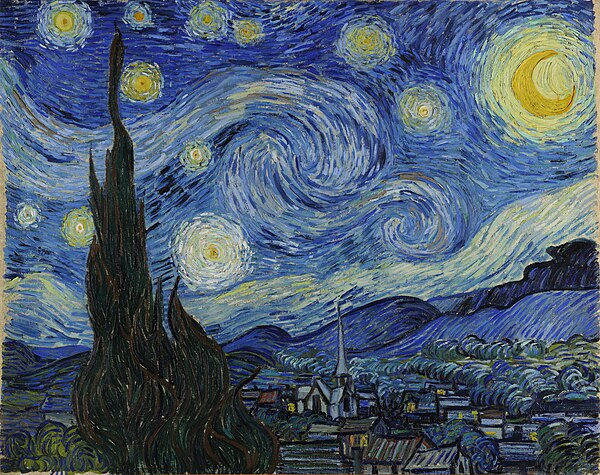

In [6]:
import requests
from PIL import Image 
from io import BytesIO

# 이미지 URL
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/600px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"

headers = { 'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36' }
response = requests.get(image_url, headers=headers)
img = Image.open(BytesIO(response.content))

# 이미지 출력
display(img)

In [7]:
# 메시지 생성 
def process_images(image_paths: list, prompt: str):

    content = [{"type": "text", "text": prompt}]

    for image_path in image_paths:
        # 이미지를 base64 문자열로 변환
        if not image_url.startswith("http"):
            image_data = get_base64_image(image_url)
        else:
            image_data = get_image_base64_from_url(image_url)

        content.append({"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{image_data}"}})

    message = HumanMessage(content=content)

    return image_model.invoke([message])

# 로컬 파일 처리 예시
image_paths = ["portrait.jpg", "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/600px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"]

result = process_images(image_paths, "이 이미지를 비교해서 설명해주세요")

print(result.content)

두 이미지는 동일한 작품인 빈센트 반 고흐의 "별이 빛나는 밤"입니다. 이 작품은 밤하늘의 별과 달, 그리고 그 아래의 마을 풍경을 독특한 색채와 강렬한 붓질로 표현하고 있습니다.

주요 요소로는:

1. **하늘**: 깊은 파란색과 회색의 소용돌이치는 구름, 밝은 노란색의 별과 달이 특징입니다.
2. **나무**: 왼쪽에 있는 높은 사이프러스 나무가 뚜렷하게 보입니다.
3. **마을**: 하늘 아래에 위치한 조용한 마을 풍경이 있으며, 교회와 집들이 보입니다.

이 작품은 감정과 분위기를 강하게 전달하며, 반 고흐의 독창적인 화풍을 잘 보여줍니다.


## 2. **도구 호출(Tool Calling)** 

- **멀티모달 모델**은 일반적인 방식으로 도구를 바인딩하여 Tool 기능을 사용할 수 있음

- Tool 호출 시 이미지 데이터와 같은 **다양한 형식의 콘텐츠 블록**을 사용 가능함

- 기존 LangChain의 Tool 시스템과 **동일한 방식**으로 멀티모달 기능을 확장하여 사용할 수 있음

In [8]:
from typing import Literal
from langchain_core.tools import tool

@tool
def weather_tool(weather: Literal["sunny", "cloudy", "rainy"]) -> str:
    """날씨 상태를 설명하는 도구"""
    if weather == "sunny":
        return "날씨가 맑습니다."
    
    elif weather == "cloudy":
        return "날씨가 흐립니다."
    
    elif weather == "rainy":
        return "비가 옵니다."

def setup_model_with_tools(model):
    return model.bind_tools([weather_tool])

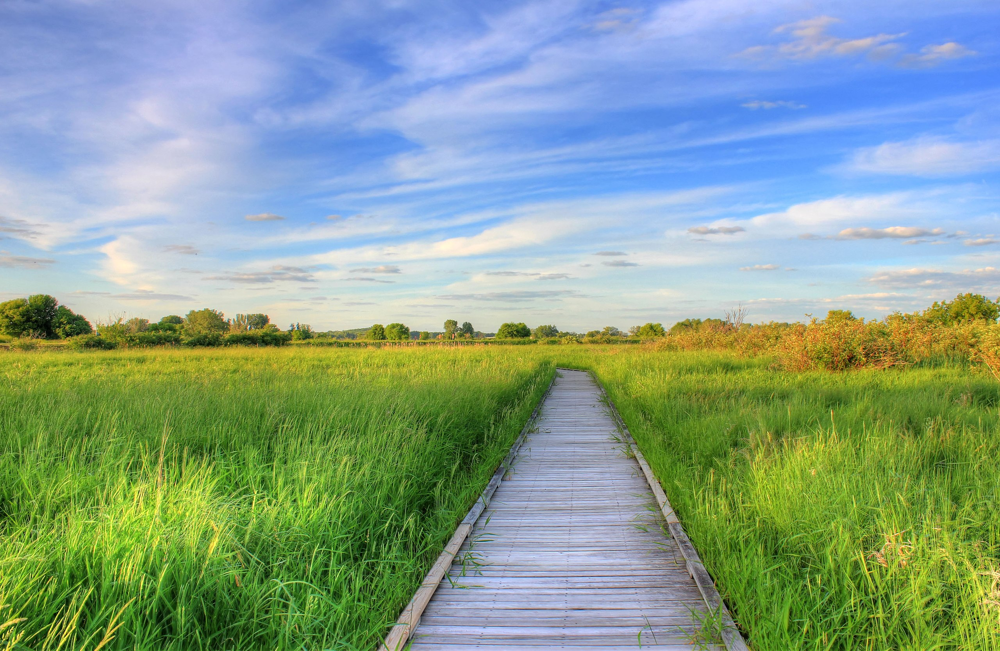

In [9]:
import requests
from PIL import Image 
from io import BytesIO

# 이미지 URL
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/dd/Gfp-wisconsin-madison-the-nature-boardwalk.jpg/2560px-Gfp-wisconsin-madison-the-nature-boardwalk.jpg"
headers = { 'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36' }
response = requests.get(image_url, headers=headers)
img = Image.open(BytesIO(response.content))

# 이미지 출력
display(img)

In [10]:
image_data = get_image_base64_from_url(image_url)

message = HumanMessage(
    content=[
        {"type": "text", "text": "이미지의 날씨를 알려주세요"},
        {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{image_data}"}}
    ],
)

# 도구 사용
model_with_tools = setup_model_with_tools(image_model)
response = model_with_tools.invoke([message])
print(response.tool_calls)

[{'name': 'weather_tool', 'args': {'weather': 'sunny'}, 'id': 'call_uaMTGGsq9LhCKIIGPM524uwf', 'type': 'tool_call'}]


In [11]:
# 도구 실행 
weather_tool.invoke(response.tool_calls[0])

ToolMessage(content='날씨가 맑습니다.', name='weather_tool', tool_call_id='call_uaMTGGsq9LhCKIIGPM524uwf')

---
### **[실습] Google Gemini 멀티모달 활용**

- 다음 API 문서를 참고해서 이미지 입력을 처리합니다. 
- 참조: https://reference.langchain.com/python/integrations/langchain_google_genai/

- pip install langchain_google_genai==0.0.11

`(1) URL 직접 전달 방식`

- 이미지:  https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/600px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg



In [12]:
import requests
from langchain_google_genai import ChatGoogleGenerativeAI
from langchain_core.messages import HumanMessage

# 모델 초기화
image_model = ChatGoogleGenerativeAI(model="gemini-2.5-flash")

# 메시지 생성 
def process_images(image_paths: list, prompt: str):

    content = [{"type": "text", "text": prompt}]
    for image_path in image_paths:
        content.append({"type": "image_url", "image_url": {"url": image_path}})

    message = HumanMessage(content=content)

    return image_model.invoke([message])


# 예시 이미지 URL
image_url =  "http://images.cocodataset.org/val2017/000000039769.jpg"
result = process_images([image_url], "이 이미지를 설명해주세요")
print(result.content)

Retrying langchain_google_genai.chat_models._chat_with_retry.<locals>._chat_with_retry in 2.0 seconds as it raised ResourceExhausted: 429 Resource has been exhausted (e.g. check quota)..
Retrying langchain_google_genai.chat_models._chat_with_retry.<locals>._chat_with_retry in 4.0 seconds as it raised ResourceExhausted: 429 Resource has been exhausted (e.g. check quota)..


이 이미지는 밝은 분홍색 담요 위에서 두 마리의 고양이가 평화롭게 잠들어 있는 모습을 위에서 내려다본 시점으로 보여줍니다.

*   **두 마리의 고양이:** 둘 다 갈색과 검은색 줄무늬가 있는 태비 고양이입니다. 몸을 길게 뻗고 매우 편안한 자세로 잠들어 있으며, 눈을 감고 있습니다.
    *   **왼쪽 고양이:** 연한 갈색과 검은색 줄무늬를 가지고 있으며, 목에 연두색 또는 초록색 목줄을 하고 있습니다. 몸을 왼쪽으로 길게 뻗은 채 머리를 왼쪽으로 향하고 있습니다.
    *   **오른쪽 고양이:** 왼쪽 고양이와 비슷한 태비 무늬를 가지고 있지만, 약간 더 붉은 갈색 톤이 섞인 듯합니다. 몸을 오른쪽으로 길게 뻗고 머리를 오른쪽으로 향한 채 잠들어 있습니다.
*   **배경 및 소품:**
    *   고양이들이 누워있는 곳은 밝은 분홍색의 부드러워 보이는 담요나 이불입니다.
    *   담요 뒤편으로는 진한 빨간색 또는 자주색의 소파 쿠션이 살짝 보입니다.
    *   고양이들 옆에는 각각 하나씩, 밝은 회색 또는 흰색의 리모컨 두 개가 놓여 있습니다. 왼쪽 고양이 머리 근처에 하나, 오른쪽 고양이 몸통 옆에 하나가 있습니다. 리모컨에는 여러 가지 색깔의 버튼들이 보입니다.

전체적으로 매우 평화롭고 아늑하며 따뜻한 분위기를 연출하며, 고양이들이 편안하게 낮잠을 즐기는 순간을 포착한 사진입니다.


`(2) 바이트 문자열 방식`

- 이미지: "portrait.jpg"



In [13]:
import base64

# 이미지를 base64로 인코딩
def get_base64_image(image_path: str) -> str:
    with open(image_path, "rb") as image_file:
        encoded_string = base64.b64encode(image_file.read()).decode("utf-8")
    return encoded_string
    
# 메시지 생성
def process_image(image_url: str, prompt: str):
    image_data = get_base64_image(image_url)
    message= HumanMessage(
        content=[
            {"type": "text", "text": prompt},
            {
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{image_data}"},
            },
        ]
    )

    return image_model.invoke([message])

# 로컬 파일 처리 예시
image_path = "portrait.jpg"
result = process_image(image_path, "이 이미지를 설명해주세요")

print(result.content)

이 이미지는 유명한 화가 빈센트 반 고흐(Vincent van Gogh)의 자화상으로 보입니다. 그의 독특하고 강렬한 화풍이 잘 드러나 있습니다.

**전반적인 특징:**
*   **화풍:** 두터운 붓질(임파스토 기법)과 역동적인 색채 사용이 특징인 후기 인상주의 또는 표현주의적 스타일입니다. 물감이 캔버스 위에 두껍게 발려 있어 질감(텍스처)이 느껴집니다.
*   **구도:** 인물이 화면 중앙에 약간 왼쪽으로 치우쳐 정면을 응시하고 있으며, 상반신 일부가 그려져 있습니다.

**인물의 특징:**
*   **얼굴:** 창백한 피부 톤에 붉은 기운이 감도는 뺨과 코가 대비를 이룹니다. 얼굴의 윤곽선은 뚜렷하며, 짧고 강한 붓질로 피부의 질감이 표현되었습니다.
*   **눈:** 강렬하고 깊이 있는 초록색 눈동자가 특징적입니다. 정면을 똑바로 응시하는 시선에서 고뇌와 집중력이 느껴집니다. 눈 주변의 붓질은 미묘한 음영을 만들어냅니다.
*   **머리카락과 수염:** 밝은 주황빛 또는 적갈색의 머리카락은 짧게 빗어 넘겨져 있으며, 수염과 콧수염도 같은 색상으로 풍성하게 표현되어 있습니다. 머리카락과 수염의 한 올 한 올이 붓질로 생생하게 묘사되어 있습니다.
*   **표정:** 전반적으로 진지하고 사려 깊은 표정이며, 내면의 고뇌가 엿보이는 듯합니다.

**의상:**
*   **재킷:** 어두운 색상의 재킷을 입고 있으며, 짙은 갈색, 빨강, 파랑 등 여러 색상이 짧고 굵은 붓질로 섞여 있어 복잡한 질감과 패턴을 이룹니다.
*   **셔츠와 넥타이:** 재킷 아래로 흰색 셔츠 칼라와 푸른색 넥타이 또는 스카프의 일부가 보입니다.

**배경:**
*   **색상과 질감:** 짙은 청록색 또는 에메랄드 그린 계열의 배경은 단색이 아니라, 작은 점들과 짧은 선들이 반복적으로 찍혀 있습니다. 주황색, 노란색, 파란색 등 다양한 색점들이 흩뿌려져 있어 배경 전체가 마치 살아 움직이는 듯한 진동감을 줍니다. 이러한 점묘법(pointillism)적인 기법은 인물의 강렬함을 

`(3) 여러 이미지 처리`



In [14]:
# 메시지 생성 
def process_images(image_paths: list, prompt: str):

    content = [{"type": "text", "text": prompt}]

    for image_path in image_paths:
        # URL의 경우 Base64 인코딩 처리
        if not image_path.startswith("http"):
            image_data = get_base64_image(image_path)
        else:
            image_data = get_image_base64_from_url(image_path)

        content.append({"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{image_data}"}})

    message = HumanMessage(content=content)

    return image_model.invoke([message])

# 로컬 파일 처리 예시
image_paths = ["portrait.jpg", "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/600px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"]

result = process_images(image_paths, "이 이미지를 비교해서 설명해주세요")

print(result.content)

두 이미지는 모두 빈센트 반 고흐(Vincent van Gogh)의 대표작으로, 그의 독특한 화풍과 강렬한 감정 표현을 잘 보여줍니다. 하지만 주제, 구성, 색채 사용, 그리고 전달하는 분위기에서 뚜렷한 차이를 보입니다.

---

**1. 왼쪽 이미지: 빈센트 반 고흐의 자화상 (Self-Portrait, 1889)**

*   **주제:** 화가 자신의 얼굴을 그린 자화상입니다. 인물의 내면과 심리 상태에 초점을 맞춥니다.
*   **구성:** 인물의 상반신이 화면을 가득 채우고 있으며, 정면을 응시하는 시선이 강렬한 인상을 줍니다. 배경은 인물을 둘러싸는 형태로 단순하게 처리되어 있습니다.
*   **색채:** 붉은 수염과 머리카락, 녹색 눈이 푸른색과 녹색이 섞인 배경과 대조를 이룹니다. 전반적으로 차분하면서도 강렬한 색채 대비가 특징입니다.
*   **붓터치:** 배경은 짧고 촘촘한 붓터치로 점묘화 같은 느낌을 주며 미묘하게 움직이는 듯한 질감을 표현했습니다. 얼굴과 수염 부분은 좀 더 섬세하면서도 두터운 붓터치로 인물의 특징을 잡아냈습니다.
*   **분위기:** 진지하고, 사색적이며, 때로는 고뇌에 찬 듯한 내면의 깊이를 전달합니다. 관람자와 직접적인 시선을 교환하며 강한 심리적 연결을 유도합니다.

---

**2. 오른쪽 이미지: 별이 빛나는 밤 (The Starry Night, 1889)**

*   **주제:** 밤하늘의 풍경과 그 아래 고요한 마을을 그린 풍경화입니다. 자연의 웅장함과 신비로움, 그리고 인간의 존재를 다룹니다.
*   **구성:** 화면의 대부분을 소용돌이치는 밤하늘이 차지하고 있으며, 왼쪽에는 거대한 사이프러스 나무가 수직으로 솟아 있습니다. 아래에는 작은 마을과 교회의 뾰족한 첨탑이 대비를 이룹니다.
*   **색채:** 깊고 강렬한 푸른색과 노란색이 주를 이루며, 강한 명암 대비와 보색 대비를 통해 밤하늘의 역동성을 극대화합니다.
*   **붓터치:** 밤하늘은 길고 격렬하며 소용돌이치는 듯한 붓터치로 가득 차 있어,

---
### **[실습] Ollama 멀티모달 활용**

- 다음 Ollama 모델을 다운로드하고, 랭체인 ChaiOllama 사용하여 멀티모달 처리합니다.
- 올라마 모델: https://ollama.com/library/gemma3
- 랭체인 문서: https://docs.langchain.com/oss/python/integrations/chat/ollama#multi-modal

- pip install "langchain-ollama<1.0"

In [15]:
# Ollama 멀티모달 실습
from langchain_ollama import ChatOllama
from langchain_core.messages import HumanMessage
import base64

# Ollama 모델 초기화 (llava는 멀티모달 지원 모델)
# 주의: ollama pull llava 명령으로 모델을 먼저 다운로드해야 합니다
image_model_ollama = ChatOllama(
    model="llava",  # 멀티모달 지원 모델
    temperature=0
)

# (1) URL 직접 전달 방식
def process_image_ollama_url(image_url: str, prompt: str):
    message = HumanMessage(
        content=[
            {"type": "text", "text": prompt},
            {"type": "image_url", "image_url": {"url": image_url}}
        ]
    )
    return image_model_ollama.invoke([message])

# (2) 바이트 문자열(base64) 방식
def process_image_ollama_base64(image_path: str, prompt: str):
    # 이미지를 base64로 인코딩
    if not image_path.startswith("http"):
        image_data = get_base64_image(image_path)
    else:
        image_data = get_image_base64_from_url(image_path)
    
    message = HumanMessage(
        content=[
            {"type": "text", "text": prompt},
            {
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{image_data}"},
            },
        ]
    )
    return image_model_ollama.invoke([message])

# (3) 여러 이미지 처리
def process_images_ollama(image_paths: list, prompt: str):
    content = [{"type": "text", "text": prompt}]
    
    for image_path in image_paths:
        # 이미지를 base64 문자열로 변환
        if not image_path.startswith("http"):
            image_data = get_base64_image(image_path)
        else:
            image_data = get_image_base64_from_url(image_path)
        
        content.append({
            "type": "image_url", 
            "image_url": {"url": f"data:image/jpeg;base64,{image_data}"}
        })
    
    message = HumanMessage(content=content)
    return image_model_ollama.invoke([message])

# 테스트 실행 (Ollama 서버가 실행 중이고 llava 모델이 설치되어 있어야 함)
try:
    # 예시 이미지 URL로 테스트
    image_url = "http://images.cocodataset.org/val2017/000000039769.jpg"
    result = process_image_ollama_url(image_url, "이 이미지를 설명해주세요")
    print("Ollama URL 방식 결과:")
    print(result.content)
except Exception as e:
    print(f"Ollama 실행 오류: {e}")
    print("주의: Ollama 서버가 실행 중이어야 하며, 'ollama pull llava' 명령으로 모델을 먼저 다운로드해야 합니다.")

Ollama 실행 오류: Error calling function `serialize_model`: ValueError: File http://images.cocodataset.org/val2017/000000039769.jpg does not exist
주의: Ollama 서버가 실행 중이어야 하며, 'ollama pull llava' 명령으로 모델을 먼저 다운로드해야 합니다.


---
### **[실습] Groq 멀티모달 활용**

- 다음 Groq 모델을 다운로드하고, 랭체인 ChatGroq 사용하여 멀티모달 처리합니다.
- Groq 문서: https://console.groq.com/docs/vision

- pip install "langchain-groq<1.0"

In [16]:
# Groq 멀티모달 실습
from langchain_groq import ChatGroq
from langchain_core.messages import HumanMessage
import base64

# Groq 모델 초기화 (Vision 지원 모델)
image_model_groq = ChatGroq(
    model="meta-llama/llama-4-scout-17b-16e-instruct", #model="llama-3.2-11b-vision-preview",  # Groq Vision 모델
    temperature=0
)

# (1) URL 직접 전달 방식
def process_image_groq_url(image_url: str, prompt: str):
    message = HumanMessage(
        content=[
            {"type": "text", "text": prompt},
            {"type": "image_url", "image_url": {"url": image_url}}
        ]
    )
    return image_model_groq.invoke([message])

# (2) 바이트 문자열(base64) 방식
def process_image_groq_base64(image_path: str, prompt: str):
    # 이미지를 base64로 인코딩
    if not image_path.startswith("http"):
        image_data = get_base64_image(image_path)
    else:
        image_data = get_image_base64_from_url(image_path)
    
    message = HumanMessage(
        content=[
            {"type": "text", "text": prompt},
            {
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{image_data}"},
            },
        ]
    )
    return image_model_groq.invoke([message])

# (3) 여러 이미지 처리
def process_images_groq(image_paths: list, prompt: str):
    content = [{"type": "text", "text": prompt}]
    
    for image_path in image_paths:
        # 이미지를 base64 문자열로 변환
        if not image_path.startswith("http"):
            image_data = get_base64_image(image_path)
        else:
            image_data = get_image_base64_from_url(image_path)
        
        content.append({
            "type": "image_url", 
            "image_url": {"url": f"data:image/jpeg;base64,{image_data}"}
        })
    
    message = HumanMessage(content=content)
    return image_model_groq.invoke([message])

# 테스트 실행 (GROQ_API_KEY 환경변수가 설정되어 있어야 함)
try:
    # (1) URL 직접 전달 방식 테스트
    image_url = "http://images.cocodataset.org/val2017/000000039769.jpg"
    result = process_image_groq_url(image_url, "이 이미지를 설명해주세요")
    print("Groq URL 방식 결과:")
    print(result.content)
    print("\n" + "="*50 + "\n")
    
    # (2) 로컬 이미지 base64 방식 테스트
    image_path = "portrait.jpg"
    result = process_image_groq_base64(image_path, "이 이미지를 설명해주세요")
    print("Groq Base64 방식 결과:")
    print(result.content)
    print("\n" + "="*50 + "\n")
    
    # (3) 여러 이미지 처리 테스트
    image_paths = [
        "portrait.jpg", 
        "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/600px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"
    ]
    result = process_images_groq(image_paths, "이 두 이미지를 비교해서 설명해주세요")
    print("Groq 여러 이미지 처리 결과:")
    print(result.content)
    
except Exception as e:
    print(f"Groq 실행 오류: {e}")
    print("주의: GROQ_API_KEY 환경변수가 설정되어 있어야 합니다.")

Groq URL 방식 결과:
The image depicts two cats lying on a pink couch, with the smaller cat on the left and the larger cat on the right. The cats are positioned in a way that suggests they are sleeping or resting.

* Two cats:
	+ One small cat on the left
	+ One large cat on the right
* Couch:
	+ Color: pink
* Remote controls:
	+ Two remote controls, one near each cat

The image appears to be a casual snapshot of two cats relaxing on a couch, possibly in a home setting.


Groq Base64 방식 결과:
이 그림은 네덜란드 화가 빈센트 반 고흐(Vincent van Gogh)가 1889년에 그린 자화상입니다. 

반 고흐는 인상파 화가로, 밝고 화려한 색채와 두꺼운 붓놀림으로 유명합니다. 이 자화상은 반 고흐의 대표작 중 하나로, 그의 내면세계를 표현한 작품으로 평가받고 있습니다.

이 그림에서 반 고흐는 짙은 녹색 배경을 바탕으로 왼쪽을 응시하고 있습니다. 그는 짙은 녹색 배경을 바탕으로 단정한 복장과 수염을 가지고 있습니다. 그의 눈은 깊고 강렬하며, 그의 표정은 진지하고 내성적입니다.

반 고흐는 정신건강 문제로 고통을 겪었는데, 이 그림은 그가 아를에 있는 생트레밀리 정신병원에 입원한 동안 그린 것입니다. 이 그림은 그의 감정과 내면세계를 표현한 것으로 해석됩니다.

전체적으로, 이 자화상은 반 고흐의 예술적 재능과 내면세계를 보여주는 대표적인 작품입니다.


Groq 여러 이미지 처리 결과:
The two images depict two of Vincent van Gogh's most fa